In [1]:
#import all the necessary packages
import IPython
import pandas as pd
from scipy.io import wavfile
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import os
os.environ["CUDA_VISIBLE_DEVICES"]="-1" #force to run on CPU to avoid complications
import matplotlib.pyplot as plt
import numpy as np
import math

from tcn import TCN, tcn_full_summary
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Dropout,Dense, BatchNormalization, LayerNormalization
from tensorflow.keras import activations
from tensorflow.keras.callbacks import CSVLogger


This is how we load the data in. Choosing num_songs fixes how many songs we load in. Each song is a 10 second long sampled at 4410 Hz.

In [2]:
#this cell gets all the music data from the file in the given path
#and puts them into a data frame
#we can choose how many files we want to load by setting num_songs
#set your music file path
directory = '../data/wav_csvs/downsample'
x_files = []
num_songs = 4
count=0
for filename in os.listdir(directory):
    if count ==num_songs: #only load num_songs number of wav files 
        break
    if('xData' in filename):
        x_files.append(pd.read_csv(directory + '/' + filename, index_col=0))
        count=count+1
        print(filename)

xData0-50-10.csv


In [3]:
#combine all the files from data frame to 2D array
#each row is a song of length 44100 (or 10 seconds at sample rate 4410 Hz)
x_combined = pd.concat(x_files)
x_combined.shape

(100, 44100)

The cell below is used to listen to the input times series. It's not necessasry for training.

In [4]:
#not necessary to run for the model. Just for testing
#play the songs to get
X = np.reshape(x_combined.values, (num_songs*100*44100))
samplerate= 44100/10
IPython.display.Audio(X, rate=samplerate)

The cell below is used to chop the entire song time series into input and output sequences. We do this by sliding a window across the long series. We can set the sequence length, the output length and the number of strides. We can also choose how many songs we want to include.

In [24]:
#function to convert songs into training input and output sequences 
#takes in long time series and splits them into chunks of a cretain seq_size
def to_sequences(dataset, stride, seq_size=1, output_len=32):
    x = []
    y = []

    for i in range(0, len(dataset)-seq_size-output_len, stride):
        window = dataset[i:(i+seq_size), 0]
        x.append(window)
        y.append(dataset[i+seq_size:i+seq_size+output_len, 0])
        
    return np.array(x),np.array(y)

#################################################################################################
seq_size = 512      # Number of time steps in each input
                    #Larger sequences (look further back) may improve forecasting.
output_len = 128    #length of the output sequence/predictions
stride = 16         #stride is the amount the window is shifted each time 
num_songs = 10      #number of songs to incule in the training

scaler = StandardScaler()

data_x_list = []
data_y_list  = []

#go through all the songs
#split them into input and output chunks
#append all the chunks into a large data set for training/testing
for song in range(num_songs):
    song_matrix = scaler.fit_transform(tf.expand_dims(x_combined.values[song],1))
    xt, yt = to_sequences(song_matrix, stride, seq_size, output_len)
    data_x_list.append(xt)
    data_y_list.append(yt)

#create the training/testing set using train_test_split
temp_array_x = np.array(data_x_list)
temp_array_y = np.array(data_y_list)
data_x = np.reshape(temp_array_x, (-1, temp_array_x.shape[2]))
data_y = np.reshape(temp_array_y, (-1, temp_array_y.shape[2]))
trainX, testX, trainY, testY = train_test_split(data_x, data_y,
                                                    test_size=0.2, 
                                                    random_state=10, 
                                                    shuffle=True)


print("Shape of training set: {}".format(trainX.shape))
print("Shape of test set: {}".format(testX.shape))

#reshape data to a Network freindly format
trainX = np.reshape(trainX, (trainX.shape[0],trainX.shape[1],1))
testX = np.reshape(testX, (testX.shape[0],testX.shape[1],1))

Shape of training set: (21736, 512)
Shape of test set: (5434, 512)


In [6]:
trainX.shape

(21688, 600, 1)

We can then make the model and choose the specific parameters. We need to set the receptive field so that it is at least as long as the sequence length.

In [25]:
#make the model

time_steps = seq_size
input_dim = 1
dilation = [1,2,4]

tcn_layer = TCN(nb_filters=128, 
                nb_stacks =1,
                dilations =dilation,
                input_shape=(time_steps, input_dim),
                kernel_size=40, 
                activation='relu',
                dropout_rate=0.05,
                return_sequences=False,
                use_skip_connections =True,
                kernel_initializer='glorot_uniform')

print('Receptive field size =', tcn_layer.receptive_field) #check if the receptive field is sufficient

model = Sequential()
model.add(tcn_layer)
model.add(Dense(256, activation="relu"))
model.add(Dense(output_len))

tcn_full_summary(model, expand_residual_blocks=False)

Receptive field size = 547
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
residual_block_0 (ResidualBl [(None, 512, 128), (None, 660992    
_________________________________________________________________
residual_block_1 (ResidualBl [(None, 512, 128), (None, 1310976   
_________________________________________________________________
residual_block_2 (ResidualBl [(None, 512, 128), (None, 1310976   
_________________________________________________________________
lambda_2 (Lambda)            (None, 128)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               33024     
_________________________________________________________________
dense_5 (Dense)              (None, 128)               32896     
Total params: 3,348,864
Trainable params: 3,348,864
Non-trainable params: 0
_________________

In [33]:
#train the model
opt = tf.optimizers.Adam()
model.compile(optimizer=opt, loss='logcosh')
csv_logger = CSVLogger("tcn_model_history.csv", append=True)

model.fit(trainX, trainY, 
                    epochs=2, 
                    batch_size=128, 
                    shuffle=True,
                    validation_data=(testX,testY),
                    callbacks=[csv_logger])


Epoch 1/2
170/170 [==============================] - 66s 386ms/step - loss: 0.1648 - val_loss: 0.1185
Epoch 2/2
170/170 [==============================] - 65s 383ms/step - loss: 0.1111 - val_loss: 0.0936


Testing:

The cells below are for testing. We can either train the model and test here or we can load a pretrained model and test. Either way we need to load the data in before we do that. If we choose to load in a pretrained model, then we need to make sure the data we load is in the correct shape for the loaded model.

In [26]:
#if you want to load a pretrained model run this
new_filepath = './saved_models/Huber.kmod'
model = keras.models.load_model(new_filepath)

This is how we do the music generation:

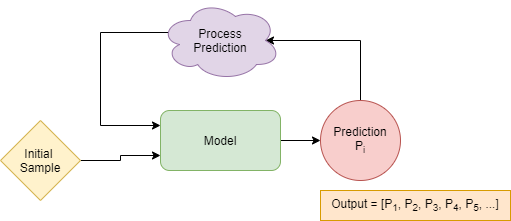

We feed in an initial random sample and then use feedback to generate more sequences.

Choose 'a' to get a testing sample from the testing data and look at the prediction. Other wise you can uncomment the specified line to provide initial random sample instead.

(512, 1)

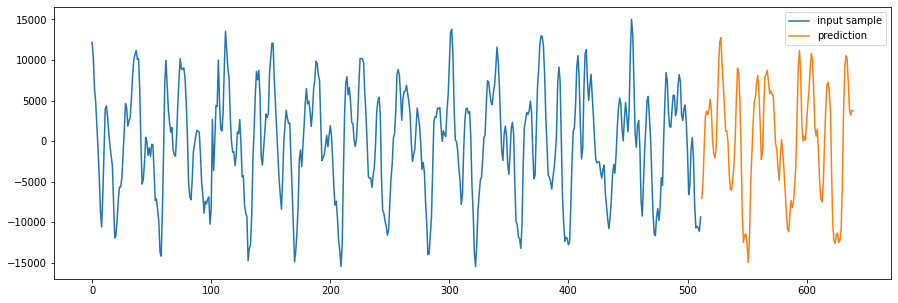

In [30]:
#testing cell
a = 10       #pull out which initial testing sample you want for prediction
x_in = testX[a]
#uncomment below to provide initial random sample instead
#x_in = np.random.randn(seq_size,1)

out = model.predict(np.array([x_in]))    

x = scaler.inverse_transform(x_in)
y = scaler.inverse_transform(out)
yy = y.flatten()
xx = x.flatten()

#plot the input sample and the prediction
y1 = np.empty(len(xx)+len(yy))
y1[:] = np.nan
y1[len(xx):] = yy
plt.figure(figsize=(15, 5))
plt.plot(xx)
plt.plot(y1)
plt.legend(['input sample','prediction'])

trainX[a].shape

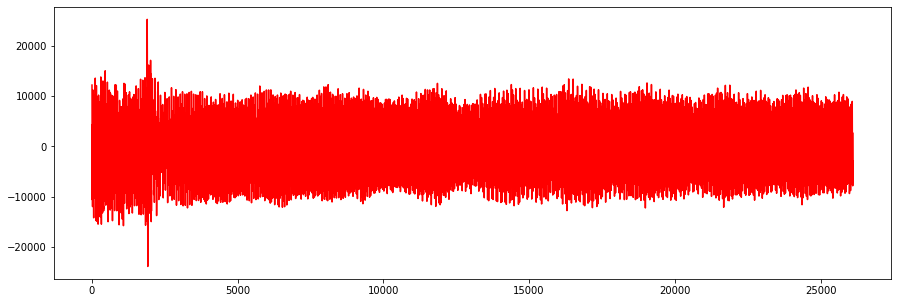

In [31]:
#generate long sequences by feedback of predictions
#set the num_feedbacks to choose the length of output
#uncomment the random input to generate sequences from random initial sample

num_feedbacks = 200
x_in = np.array([testX[a]])
#uncomment to give initial random sample instead
#x_in = np.array([np.random.randn(seq_size,1)])

song_out = x_in
for i in range(num_feedbacks): 
    temp = model.predict(x_in)
    song_out = np.append(song_out, temp)
    x_in = song_out[output_len*(i+1):]
    x_in = np.reshape(x_in, (1,-1))

song_out = scaler.inverse_transform(song_out).flatten()

#plot the input sample and predictions
plt.figure(figsize=(15, 5))
plt.plot(song_out, 'r')

In [32]:
#play the predicted music
int_data = song_out.astype(int)
samplerate= 44100/10
IPython.display.Audio(int_data, rate=samplerate)

In [ ]:
model.save('LogCosh_lossTCN.kmod')